In [1]:
%load_ext autoreload
%autoreload 2

import os
import time
import sys
sys.path.append(os.path.join(os.environ['REPO_DIR'], 'utilities'))
from utilities2015 import *
from annotation_utilities import contours_to_mask
from registration_utilities import find_contour_points

import numpy as np

sys.path.append('/oasis/projects/nsf/csd181/yuncong/opencv-2.4.9/release/lib/python2.7/site-packages')
import cv2

import matplotlib.pyplot as plt
%matplotlib inline

# from skimage.filters.rank import entropy
from skimage.morphology import remove_small_objects, disk, remove_small_holes, binary_dilation, disk, binary_closing
# from skimage.measure import label, regionprops
# from skimage.color import rgb2gray
from skimage.io import imread, imsave
# from skimage.segmentation import active_contour
# from skimage.filters import gaussian, threshold_adaptive
from skimage.util import img_as_ubyte

# from sklearn.mixture import GaussianMixture
# from sklearn.cluster import KMeans

Setting environment for Gordon


No vtk


In [2]:
fn = 'MD652-F77-2016.12.17-16.40.35_MD652_3_0231'
stack = 'MD652'

In [3]:
input_dir = '/home/yuncong/CSHL_data/%(stack)s' % dict(stack=stack)

In [4]:
VMAX_PERCENTILE = 99
VMIN_PERCENTILE = 1
GAMMA = 2. # if gamma > 1, image is darker.

In [5]:
if fn.split('-')[1][0] == 'N':
    modality = 'nissl'
elif fn.split('-')[1][0] == 'F':
    modality = 'fluorescent'
else:
    raise

105.0 191.0


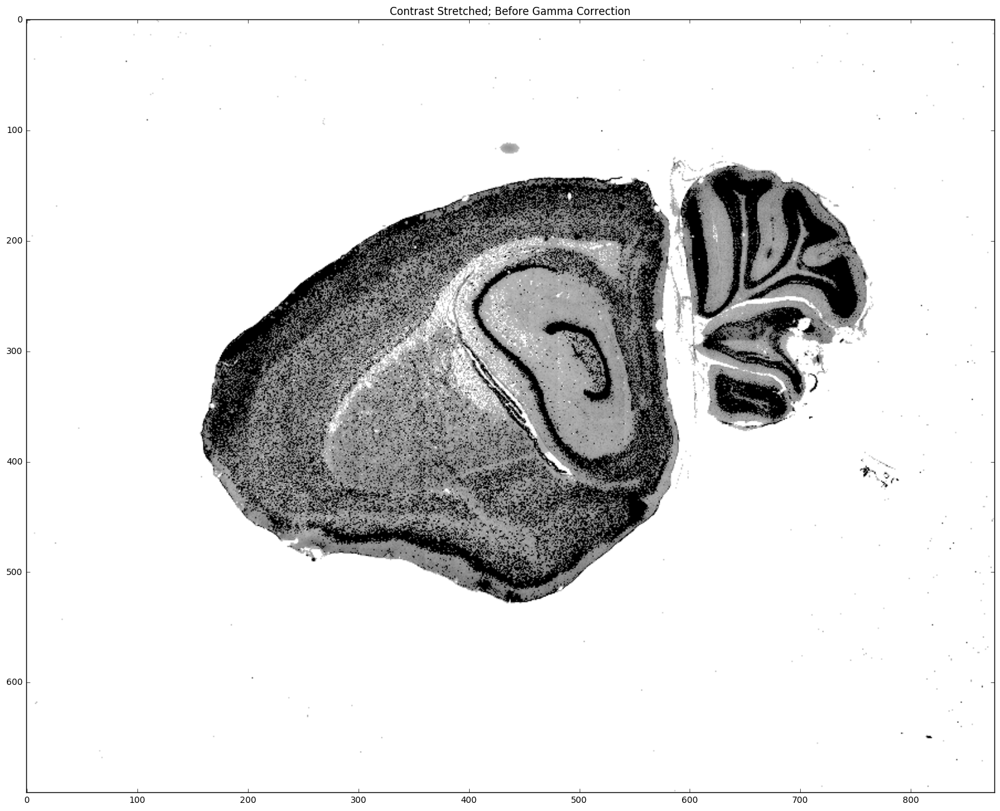

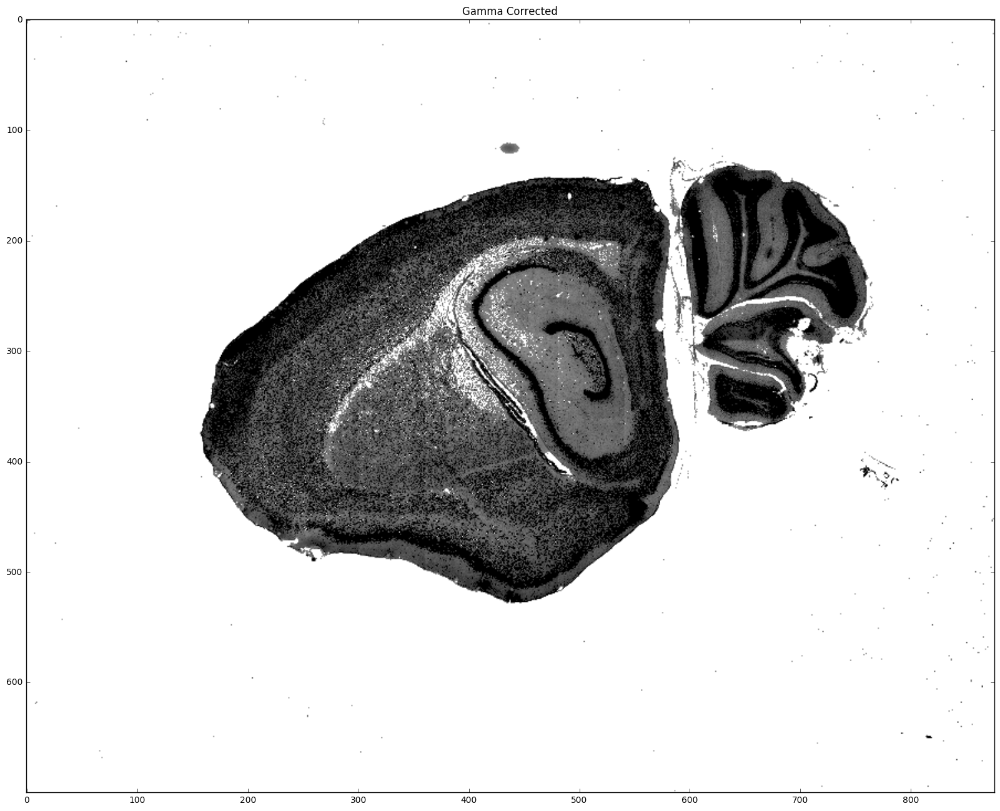

In [7]:
img_rgb = imread(input_dir + '/%(fn)s.tif' % dict(fn=fn)) # uint16 for fluoro, uint8 for nissl.
img = img_rgb[..., 1].copy() # Don't use blue channel, a lot of brightness at the background; the other channels are in fact more contrasty.
    
if modality == 'fluorescent':
    img = img.max() - img # invert, make tissue dark on bright background

# Stretch contrast

img_flattened = img.flatten()
vmax = np.percentile(img_flattened, VMAX_PERCENTILE)
vmin_perc = VMIN_PERCENTILE
while True:
    vmin = np.percentile(img_flattened, vmin_perc)
    if vmin > 0:
        break
    else:
        vmin_perc += 1
        
print vmin, vmax

img[(img <= vmax) & (img >= vmin)] = (255./(vmax-vmin)*(img[(img <= vmax) & (img >= vmin)]-vmin)).astype(np.uint8)
img[img > vmax] = 255
img[img < vmin] = 0
img = img.astype(np.uint8)

plt.figure(figsize=(20,20));
plt.imshow(img, cmap=plt.cm.gray)
plt.title('Contrast Stretched; Before Gamma Correction');
plt.show();

# Gamma correction.

img = img_as_ubyte(img_as_float(img)**GAMMA)

plt.figure(figsize=(20,20));
plt.imshow(img, cmap=plt.cm.gray)
plt.title('Gamma Corrected');
plt.show();

In [90]:
# img_rgb = imread(input_dir + '/%(fn)s.tif' % dict(fn=fn)) # uint16 for fluoro, uint8 for nissl.

# # Don't use blue channel, a lot of brightness at the background; the other channels are in fact more contrasty.
# # for i in range(3):
# for i in [0]:
#     img = img_rgb[..., i].copy()

#     # Stretch contrast
    
#     img_flattened = img.flatten()
#     vmax = np.percentile(img_flattened, VMAX_PERCENTILE)
    
#     vmin_perc = 1
#     while True:
#         vmin = np.percentile(img_flattened, vmin_perc)
#         if vmin > 0:
#             break
#         else:
#             vmin_perc += 1            
#     print vmin, vmax
    
#     img[(img <= vmax) & (img >= vmin)] = (255./(vmax-vmin)*(img[(img <= vmax) & (img >= vmin)]-vmin)).astype(np.uint8)
#     img[img > vmax] = 255
#     img[img < vmin] = 0
    
#     img_rgb_bf[..., i] = img

# img_bf = img_rgb_bf[..., 0]
# # img_bf = np.min(img_rgb_bf, axis=2)

# if modality == 'fluorescent':
#     img_bf = 255 - img_bf

# plt.figure(figsize=(20,20));
# plt.imshow(img_bf, cmap=plt.cm.gray)
# plt.title('Contrast Stretched; Before Gamma Correction');
# plt.show();

# # Gamma correction.

# img_bf_gamma_corrected = img_as_ubyte(img_as_float(img_bf)**GAMMA)

# plt.figure(figsize=(20,20));
# plt.imshow(img_bf_gamma_corrected, cmap=plt.cm.gray)
# plt.title('Gamma Corrected');
# plt.show();

In [91]:
# img_rgb = imread('/home/yuncong/CSHL_data_processed/%(stack)s/%(stack)s_brightfieldized/%(fn)s.tif' % dict(stack=stack, fn=fn))
# img = rgb2gray(img_rgb)

# plt.figure(figsize=(20,20));
# plt.imshow(img, cmap=plt.cm.gray)
# plt.show();

# Option 1: Graph cut based method.


In [120]:
SLIC_SIGMA = 3
SLIC_COMPACTNESS = 10
SLIC_N_SEGMENTS = 1000
SLIC_MAXITER = 100

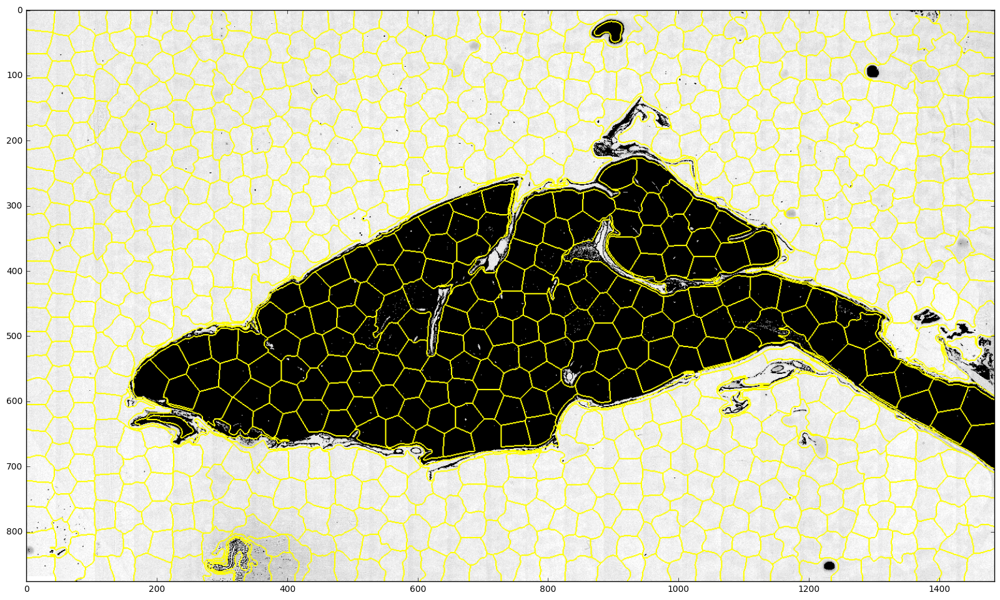

In [121]:
from skimage.segmentation import slic
from skimage.future.graph import rag_mean_color, cut_normalized, cut_threshold
from skimage.color import label2rgb

# Input to slic() must be float
slic_labels = slic(img.astype(np.float), sigma=SLIC_SIGMA, compactness=SLIC_COMPACTNESS, n_segments=SLIC_N_SEGMENTS, 
                   multichannel=False, max_iter=SLIC_MAXITER)
# slic_viz = label2rgb(slic_labels, img, kind='avg');

# plt.figure(figsize=(20,20));
# plt.imshow(slic_viz);
# plt.show();

from skimage.segmentation import mark_boundaries
slic_boundaries = mark_boundaries(img, label_img=slic_labels, background_label=-1)

plt.figure(figsize=(20,20));
plt.imshow(slic_boundaries);
plt.show();

In [122]:
SUPERPIXEL_SIMILARITY_SIGMA = 200.
SUPERPIXEL_MERGE_SIMILARITY_THRESH = .2
GRAPHCUT_NUM_CUTS = 20

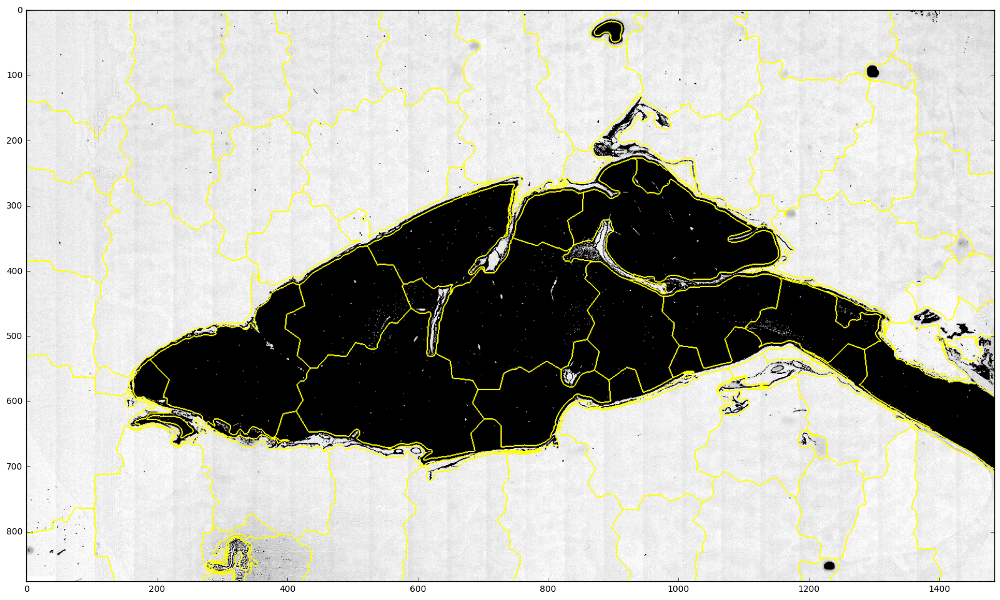

In [123]:
sim_graph = rag_mean_color(img, slic_labels, mode='similarity', sigma=SUPERPIXEL_SIMILARITY_SIGMA)

# plt.hist([a['weight'] for n, d in sim_graph.adjacency_iter() for a in d.itervalues()], bins=100);
# plt.title('Distribution of edge weights.');
# plt.xlabel('Edge weight');

# Normalized cut - merge superpixels.

ncut_labels = cut_normalized(slic_labels, sim_graph, in_place=False, thresh=SUPERPIXEL_MERGE_SIMILARITY_THRESH,
                            num_cuts=GRAPHCUT_NUM_CUTS)
# ncut_labels = cut_normalized(slic_labels, sim_graph, in_place=False, thresh=superpixel_merge_sim_thresh)

# ncut_viz = label2rgb(ncut_labels, img, kind='avg')

# plt.figure(figsize=(20,20));
# plt.imshow(ncut_viz);
# plt.show();

# Visualize

from skimage.segmentation import mark_boundaries
ncut_boundaries_viz = mark_boundaries(img, label_img=ncut_labels, background_label=-1)

plt.figure(figsize=(20,20));
plt.imshow(ncut_boundaries_viz);
plt.show();

In [124]:
# Find background superpixels.

background_labels = np.unique(np.concatenate([ncut_labels[:,0], 
                                              ncut_labels[:,-1], 
                                              ncut_labels[0,:], 
                                              ncut_labels[-1,:]]))

# background_labels = np.unique(np.concatenate([ncut_labels[:20,0], ncut_labels[-20:,0],
#                                               ncut_labels[:20,-1], ncut_labels[-20:,-1], 
#                                               ncut_labels[0,:20], ncut_labels[0,-20:], 
#                                               ncut_labels[-1,:20], ncut_labels[-1,-20:]]))

In [129]:
BORDER_DISSIMILARITY_PERCENTILE = 30
FOREGROUND_DISSIMILARITY_THRESHOLD = .5
MIN_SIZE = 1000

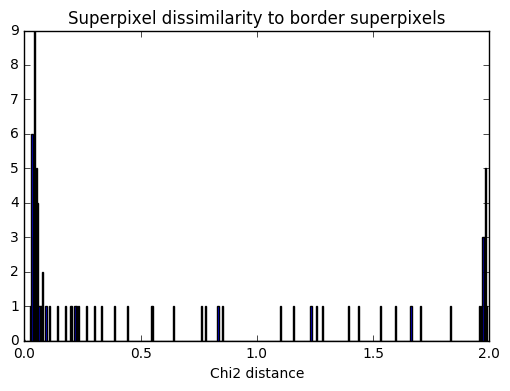

In [130]:
# Collect training superpixels.

train_histos = []
for b in background_labels:
    histo = np.histogram(img[ncut_labels == b], bins=np.arange(0,256,5))[0].astype(np.float)
    histo = histo/np.sum(histo)
    train_histos.append(histo)
    
# for histo in train_histos:
#     plt.bar(np.arange(0,255,5)[:-1], histo);
#     plt.show();

# Compute dissimilarity of superpixels to border superpixels.

histos = {}
for l in np.unique(ncut_labels):
    histo = np.histogram(img[ncut_labels == l], bins=np.arange(0,256,5))[0].astype(np.float)
    histo = histo/np.sum(histo)
    histos[l] = histo
    
hist_distances = {}
for l, h in histos.iteritems():
    hist_distances[l] = np.percentile([chi2(h, th) for th in train_histos], BORDER_DISSIMILARITY_PERCENTILE)
    # min is too sensitive if there is a blob at the border
    
plt.hist(hist_distances.values(), bins=np.arange(0,2,.005));
plt.title('Superpixel dissimilarity to border superpixels');
plt.xlabel('Chi2 distance');
plt.show();

# plt.stem(hist_distances.values());
# plt.show();

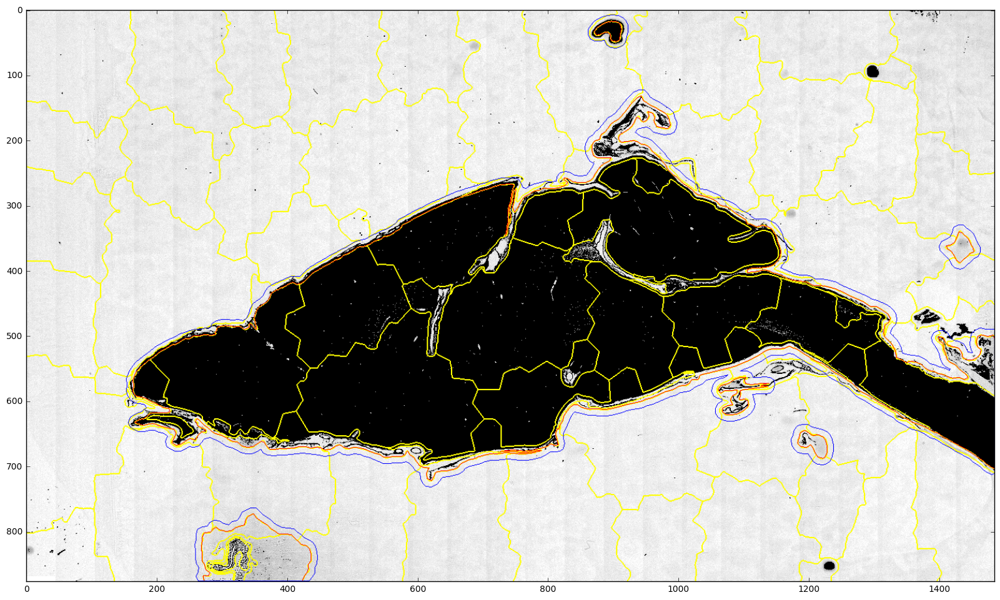

In [131]:
# Generate mask for snake's initial contours.

entropy_mask = np.zeros_like(img, np.bool)
for l, d in hist_distances.iteritems():
    if d > FOREGROUND_DISSIMILARITY_THRESHOLD:
        entropy_mask[ncut_labels == l] = 1

# Dilate mask to make room for snake operation.

dilated_entropy_mask = binary_dilation(entropy_mask, disk(10))
dilated_entropy_mask = remove_small_holes(dilated_entropy_mask, min_size=2000)
dilated_entropy_mask = remove_small_objects(dilated_entropy_mask, min_size=MIN_SIZE)

# Visualize

viz = img_as_ubyte(ncut_boundaries_viz)
for cnt in find_contour_points(entropy_mask)[1]:
    cv2.polylines(viz, [cnt.astype(np.int)], True, (255,0,0), 1) # red

for cnt in find_contour_points(dilated_entropy_mask)[1]:
    cv2.polylines(viz, [cnt.astype(np.int)], True, (0,0,255), 1) # blue
    
plt.figure(figsize=(20,20));
plt.imshow(viz);
plt.show();

In [74]:
INTENSITY_FOREGROUND_PERCENTILE = 10
INTENSITY_BACKGROUND_PERCENTILE = 99

255.0 215.0


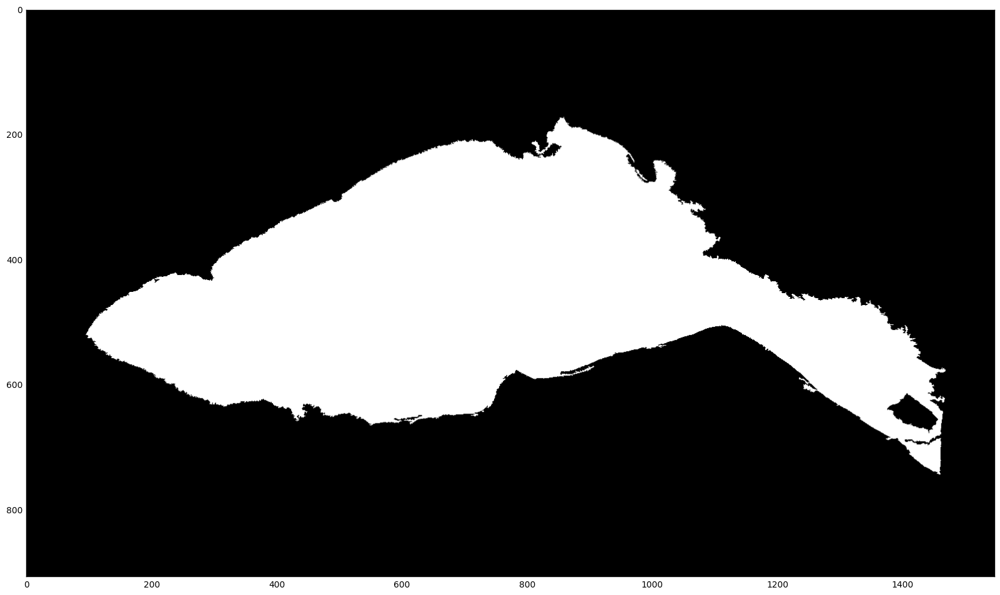

In [75]:
# Enhance intensity.

cc = np.concatenate([img[ncut_labels == b] for b in background_labels])
# plt.hist(cc, bins=100, normed=True);
# plt.show();

bg_high = np.percentile(cc, INTENSITY_BACKGROUND_PERCENTILE)
bg_low = np.percentile(cc, INTENSITY_FOREGROUND_PERCENTILE)

print bg_high, bg_low

# foreground_mask = img_as_ubyte(np.minimum(1, gaussian(img, 1))) < bg_low
foreground_mask = img < bg_low

foreground_mask[~dilated_entropy_mask] = 0

foreground_mask = remove_small_objects(foreground_mask, min_size=2000)
foreground_mask = remove_small_holes(foreground_mask, min_size=2000)

plt.figure(figsize=(20,20));
plt.imshow(foreground_mask, cmap=plt.cm.gray);
plt.show();

In [82]:
# # Compute gradient map.

# gx, gy = np.gradient(gaussian(img, sigma=1))
# g = np.sqrt(gx**2+gy**2)

# plt.figure(figsize=(20,20));
# plt.imshow(g, cmap=plt.cm.gray, vmin=0, vmax=.5);
# plt.title('Gradient map');
# plt.show();

In [83]:
# # Compute adaptive histogram equalized version.

# from skimage.exposure import equalize_adapthist
# img_enhanced = img_as_ubyte(equalize_adapthist(img, kernel_size=101, clip_limit=0.1, nbins=64))

# plt.figure(figsize=(20,20));
# plt.imshow(img_enhanced, cmap=plt.cm.gray);
# plt.title('Adaptive histogram equalized');
# plt.show();

In [76]:
CANNY_EDGE_SIGMA = 1
CANNY_LOW_THRESH = .2
CANNY_HIGH_THRESH = .5

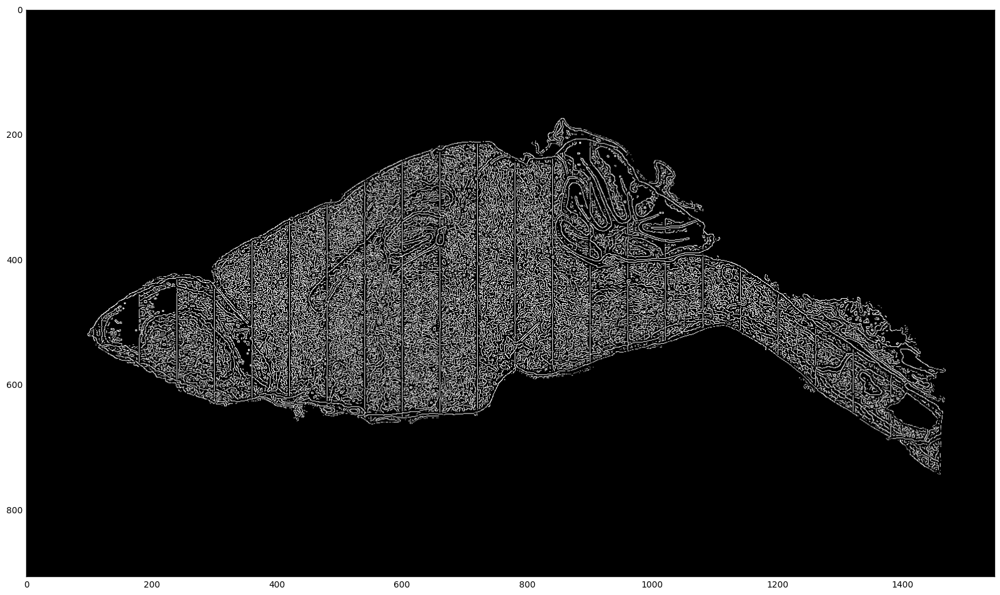

In [77]:
# Enhance edges.

from skimage.feature import canny

is_edge = canny(img, sigma=CANNY_EDGE_SIGMA, low_threshold=CANNY_LOW_THRESH, high_threshold=CANNY_HIGH_THRESH)
# is_edge[~ entropy_mask] = 0
# is_edge[~ binary_dilation(entropy_mask, disk(5))] = 0
# is_edge[~dilated_entropy_mask] = 0
is_edge[~foreground_mask] = 0

plt.figure(figsize=(20,20));
plt.imshow(is_edge, cmap=plt.cm.gray);
plt.show();

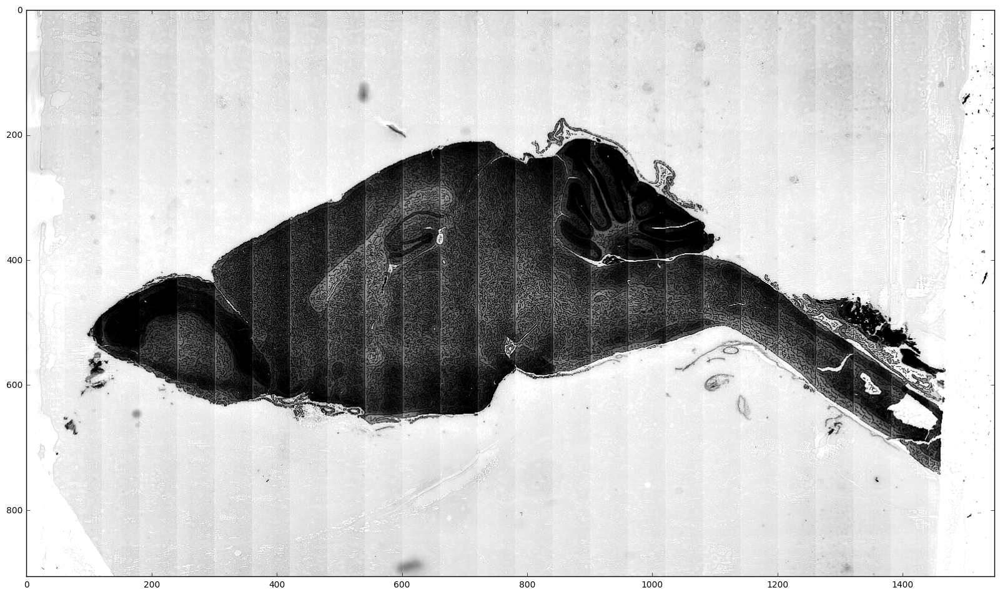

In [78]:
# Enhanced image - combine intensity and edge enhancement.

img_enhanced = img.copy()

# Enhance intensity.

# img_enhanced[foreground_mask] = np.maximum((img[foreground_mask]-50).astype(np.int), 0)

# plt.figure(figsize=(20,20));
# plt.imshow(img_enhanced, cmap=plt.cm.gray);
# plt.show();

# Enhance edges.

img_enhanced[is_edge] = 0

plt.figure(figsize=(20,20));
plt.imshow(img_enhanced, cmap=plt.cm.gray);
plt.show();

# Option 2: Entropy distribution fitting based method.

In [87]:
# h, w = img.shape
# e = entropy(img, disk(5))

# plt.figure(figsize=(20,20));
# plt.imshow(e);
# plt.show();


# plt.figure();
# plt.title('entropy distribution');
# plt.hist(e.flatten(), bins=100);

# x = np.atleast_2d(e[e > .1]).T

# bics = []
# clfs = []
# # for nc in [3]:
# for nc in [2,3]:
# # for nc in [2]:
#     clf = GaussianMixture(n_components=nc, covariance_type='full')
#     clf.fit(x)
#     bic = clf.bic(x)
#     bics.append(bic)
#     clfs.append(clf)
    
# print 'num. components', [2,3][np.argsort(bics)[0]]

# clf = clfs[np.argsort(bics)[0]]

# covars = np.atleast_1d(np.squeeze(clf.covariances_))


# if clf.n_components == 3:
#     invalid_component = np.where(covars > .4)[0]
#     if len(invalid_component) == 1:
#         valid_components = [i for i in range(3) if i != invalid_component]
#     else:
#         assert len(invalid_component) == 0
#         valid_components = range(clf.n_components)
        
# covars = np.atleast_1d(np.squeeze(clf.covariances_))[valid_components]        
# means = np.atleast_1d(np.squeeze(clf.means_))[valid_components]
# weights = clf.weights_[valid_components]

# counts, bins = np.histogram(e.flat, bins=100, density=True);
# gs = np.array([w * 1./np.sqrt(2*np.pi*c) * np.exp(-(bins-m)**2/(2*c)) for m, c, w in zip(means, covars, weights)])

# plt.figure();
# plt.title('fitted guassians');
# plt.plot(bins, gs.T);


# new_means = []
# new_covs = []
# new_weights = []

# # Force into 2 classes: foreground and background
# km = KMeans(2)
# km.fit([[x]for x in means])
# for l in set(km.labels_):
#     new_mean = means[km.labels_ == l].mean()
#     new_cov = covars[km.labels_ == l].mean()
#     new_weight = weights[km.labels_ == l].sum()
    
#     new_means.append(new_mean)
#     new_covs.append(new_cov)
#     new_weights.append(new_weight)

# order = np.argsort(new_means)
# new_means = np.array(new_means)[order]
# new_covs = np.array(new_covs)[order]
# new_weights = np.array(new_weights)[order]

# counts, bins = np.histogram(e.flat, bins=100, density=True);

# # ignore small components
# gs = np.array([w * 1./np.sqrt(2*np.pi*c) * np.exp(-(bins-m)**2/(2*c)) for m, c, w in zip(new_means, new_covs, new_weights)])

# plt.figure();
# plt.title('fitted guassians');
# plt.plot(bins, gs.T);

# thresh = bins[np.where(gs[-1] - gs[-2] < 0)[0][-1]]
# thresh = 5.
# print thresh

# mask = e > thresh


# img2 = img.copy()
# img2[~mask] = 0

# plt.figure(figsize=(20,20));
# plt.imshow(img2, cmap=plt.cm.gray);
# plt.title('before removing small objects');
# plt.show();


# component_areas = [p.area for p in regionprops(label(mask))]
# max_area = np.max(component_areas)
# min_size = min(max_area, 5000)

# mask_rso = remove_small_objects(mask, min_size=min_size, connectivity=8)

# img2 = img.copy()
# img2[~mask_rso] = 0
# plt.figure(figsize=(20,20));
# plt.imshow(img2, cmap=plt.cm.gray);
# plt.title('after removing small objects');
# plt.show();


# mask_rsh = remove_small_holes(mask_rso, min_size=20000, connectivity=8)

# img2 = img.copy()
# img2[~mask_rsh] = 0
# plt.figure(figsize=(20,20));
# plt.imshow(img2, cmap=plt.cm.gray);
# plt.title('after removing small holes');
# plt.show();

In [88]:
# entropy_mask = mask_rsh
# plt.imshow(entropy_mask);

# Option 3: Simple box mask.

In [89]:
# entropy_mask = np.zeros_like(img, np.bool)
# entropy_mask[50:-50, 50:-50] = 1

# Continue

In [79]:
# Find contours from mask.

# orig_init_contours = [xys for xys in find_contour_points(entropy_mask.astype(np.int), sample_every=1)[1] 
#                  if len(xys) > 50]

init_contours = [xys for xys in find_contour_points(dilated_entropy_mask.astype(np.int), sample_every=1)[1] 
                 if len(xys) > 50]

# assert len(init_contours) > 0, 'No contour is detected from entropy mask %s' % fn
print 'Extracted %d contours from mask.' % len(init_contours)

Extracted 2 contours from mask.


In [80]:
# MIN_STD = 50
# MIN_ENTROPY = 10

In [81]:
# Option 1: Morphsnake approach

# Create initial levelset

from scipy.stats import entropy

init_levelsets = []
for cnt in init_contours:
    init_levelset = np.zeros_like(img, np.float)
    init_levelset[contours_to_mask([cnt], img.shape[:2])] = 1.
    init_levelset[:10, :] = 0
    init_levelset[-10:, :] = 0
    init_levelset[:, :10] = 0
    init_levelset[:, -10:] = 0
    
#     plt.hist(img_rgb[init_levelset.astype(np.bool), 2], bins=np.arange(0,256));
#     plt.show();
    
#     val_entropy = entropy(img_rgb[init_levelset.astype(np.bool), 2])
#     sys.stderr.write('Entropy: %.2f.\n' % val_entropy)
    
#     val_std = np.std(img_rgb[init_levelset.astype(np.bool), 2])
#     sys.stderr.write('Contrast: %.2f.\n' % val_std)

#     if val_entropy < MIN_ENTROPY:
#         sys.stderr.write('Entropy too low, ignore.\n')
#         continue

#     if val_std < MIN_STD:
#         sys.stderr.write('Contrast too low, ignore.\n')
#         continue
    
    init_levelsets.append(init_levelset)

In [82]:
# # Fluorescent
# MORPHSNAKE_SMOOTHING = 3
# MORPHSNAKE_LAMBDA1 = 1.
# MORPHSNAKE_LAMBDA2 = 2.
# MORPHSNAKE_MAXITER = 200
# MORPHSNAKE_MINITER = 10
# PIXEL_CHANGE_TERMINATE_CRITERIA = 3
# AREA_CHANGE_RATIO_TERMINATE_CRITERIA = 2.

# Nissl
MORPHSNAKE_SMOOTHING = 3
MORPHSNAKE_LAMBDA1 = 1.
MORPHSNAKE_LAMBDA2 = 2.
MORPHSNAKE_MAXITER = 200
MORPHSNAKE_MINITER = 10
PIXEL_CHANGE_TERMINATE_CRITERIA = 3
AREA_CHANGE_RATIO_TERMINATE_CRITERIA = 2.

In [83]:
#####################
# Evolve morphsnake #
#####################

import morphsnakes
from collections import deque

final_masks = []

for init_levelset in init_levelsets:

    discard = False
    init_area = np.count_nonzero(init_levelset)
    
    t = time.time()

    msnake = morphsnakes.MorphACWE(img_enhanced.astype(np.float), smoothing=int(MORPHSNAKE_SMOOTHING), 
                                   lambda1=MORPHSNAKE_LAMBDA1, lambda2=MORPHSNAKE_LAMBDA2)
    
    msnake.levelset = init_levelset.copy()
    
    dq = deque([None, None])
    for i in range(MORPHSNAKE_MAXITER): 

        # At stable stage, the levelset (thus contour) will oscilate, 
        # so instead of comparing to previous levelset, must compare to the one before the previous
        oneBefore_levelset = dq.popleft()
    
        # If less than 3 pixels are changed, stop.
        if i > MORPHSNAKE_MINITER:
            if np.count_nonzero(msnake.levelset - oneBefore_levelset) < PIXEL_CHANGE_TERMINATE_CRITERIA:
                break
        
        # If area changes more than 2, stop.
        area_change_ratio = np.count_nonzero(msnake.levelset)/float(init_area)
#         sys.stderr.write('Area change: %.2f.\n' % area_change_ratio)
        if np.abs(np.log2(area_change_ratio)) > AREA_CHANGE_RATIO_TERMINATE_CRITERIA:
            discard = True
            sys.stderr.write('Area change too much, stop iteration.\n')
            break
                
        dq.append(msnake.levelset)
        
#         t = time.time()
        msnake.step()
#         sys.stderr.write('Step: %f seconds\n' % (time.time()-t)) # 0.6 second / step
    
    sys.stderr.write('Snake finished at iteration %d.\n' % i)
    sys.stderr.write('Snake: %.2f seconds\n' % (time.time()-t)) # 72s
    
    if discard:
        sys.stderr.write('Discarded.\n')
        continue
    else:
        # Handles the case that a single initial contour morphs into multiple contours
        labeled_mask = label(msnake.levelset.astype(np.bool))
        for l in np.unique(labeled_mask):
            if l != 0:
                final_masks.append(labeled_mask == l)
                sys.stderr.write('Final masks added.\n')

Snake finished at iteration 74.
Snake: 54.36 seconds
Area change too much, stop iteration.
Snake finished at iteration 51.
Snake: 36.43 seconds
Discarded.


# Export

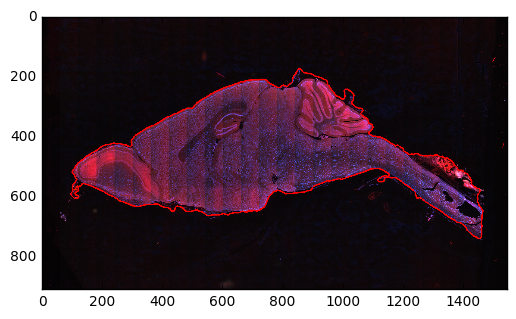

In [84]:
# submask_dir = create_if_not_exists('/home/yuncong/CSHL_data_processed/%(stack)s/%(stack)s_submasks/%(fn)s' % {'fn':fn, 'stack':stack})
# execute_command('rm -f %s/*' % submask_dir)

img_rgb = imread(os.path.join(input_dir, fn + '.png'))

for i, mask in enumerate(final_masks):
#     imsave(os.path.join(submask_dir,'%(fn)s_submask_%(i)d.png' % {'fn': fn, 'i':i+1}), img_as_ubyte(mask))
#     plt.imshow(mask, cmap=plt.cm.gray);
#     plt.show();

    viz = img_rgb.copy()
    cnt_all_labels = find_contour_points(mask)
    if len(cnt_all_labels) == 0:
        continue
    for cnt in cnt_all_labels[1]:
        cv2.polylines(viz, [cnt.astype(np.int)], True, (255,0,0), 3) # red
#     viz_fn = os.path.join(submask_dir, '%(fn)s_submask_%(i)d_overlayViz.tif' % dict(fn=fn, i=i+1))
#     sys.stderr.write(viz_fn + '\n')
#     imsave(viz_fn, viz)
    plt.imshow(viz);
    plt.show();

# Automatically judge the goodness of each mask

In [73]:
n = len(final_masks)
decisions = [0 for _ in range(n)]
undecided = []
negatives = []
positives = []

if n == 1: # If only one mask, assign it positive.
    decisions[0] = 1
    undecided.append(0)
else:
    for i in range(n):
        if np.count_nonzero(final_masks[i]) < 10000:
            decisions[i] = -1
            negatives.append(i)
        else:
            decisions[i] = 0
            positives.append(i)

# If only one undecided and the rest are negative, make the undecided positive.
if len(undecided) == 1 and len(negatives) == n - len(undecided):
    decisions[undecided[0]] = 1

# If there are more than one positives, make all other undecided negative.
if len(positives) >= 1:
    for u in undecided:
        decisions[u] = -1

# Write to file. Slot index starts with 1.
with open(os.path.join(submask_dir, '%(fn)s_submasksAlgReview.txt' % dict(fn=fn, stack=stack)), 'w') as f:
    for i, dec in enumerate(decisions):
        f.write('%d %d\n' % (i+1, dec))

In [97]:
submask_dir = create_if_not_exists('/home/yuncong/CSHL_data_processed/%(stack)s/%(stack)s_submasks/%(fn)s' % {'fn':fn, 'stack':stack})

if os.path.exists(submask_dir):
    execute_command('rm -r %s' % submask_dir)
    create_if_not_exists(submask_dir)

rm -r /home/yuncong/CSHL_data_processed/MD652/MD652_submasks/MD652-F47-2016.12.17-06.39.51_MD652_1_0139


Child returned 0


In [98]:
masks = []
indices = []

In [99]:
i = 0
for final_levelset in final_levelsets:
    l = label(final_levelset)
    for ll in np.unique(l):
        if ll != 0:
            mask = l == ll
            
            indices.append(i)
            masks.append(mask)
            
            vals = img_rgb[mask, 2]
            val_entropy = entropy(vals)
            sys.stderr.write('Entropy: %.2f.\n' % val_entropy)
            val_std = np.std(vals)
            sys.stderr.write('Contrast: %.2f.\n' % val_std)
            
            i += 1
            imsave(submask_dir + '/%(fn)s_submasks_%(i)d.png' % {'fn': fn, 'i':i}, img_as_ubyte(mask))

Entropy: 12.38.
Contrast: 59.43.
Entropy: 8.97.
Contrast: 127.49.
/oasis/projects/nsf/csd395/yuncong/brain_virtualenv/lib/python2.7/site-packages/skimage/io/_io.py:132: UserWarning: /home/yuncong/CSHL_data_processed/MD652/MD652_submasks/MD652-F47-2016.12.17-06.39.51_MD652_1_0139/MD652-F47-2016.12.17-06.39.51_MD652_1_0139_submasks_2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Entropy: 8.67.
Contrast: 6.35.
/oasis/projects/nsf/csd395/yuncong/brain_virtualenv/lib/python2.7/site-packages/skimage/io/_io.py:132: UserWarning: /home/yuncong/CSHL_data_processed/MD652/MD652_submasks/MD652-F47-2016.12.17-06.39.51_MD652_1_0139/MD652-F47-2016.12.17-06.39.51_MD652_1_0139_submasks_3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Entropy: 12.04.
Contrast: 4.15.
Entropy: 11.41.
Contrast: 17.10.


In [31]:
# gallery_dir = create_if_not_exists('/home/yuncong/CSHL_data_processed/%(stack)s/%(stack)s_submaskGallery' % {'stack': stack})
# display_images_in_grids(masks, nc=5, titles=[str(i) for i in indices],
#                         export_fn=os.path.join(gallery_dir, '%(fn)s_submaskGallery.png' % {'fn': fn}))    

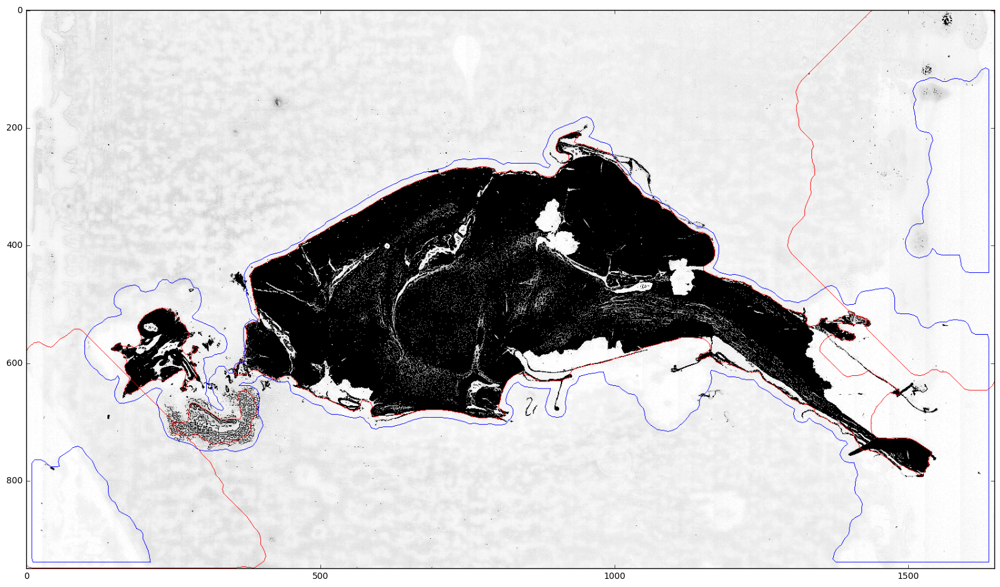

In [100]:
viz = gray2rgb(img_enhanced)
# viz = gray2rgb(img)

for final_levelset, init_levelset in zip(final_levelsets, init_levelsets):
    
    for cnt in find_contour_points(final_levelset)[1]:
        cv2.polylines(viz, [cnt.astype(np.int)], True, (255,0,0), 1) # red
        
    for cnt in find_contour_points(init_levelset)[1]:
        cv2.polylines(viz, [cnt.astype(np.int)], True, (0,0,255), 1) # blue

plt.figure(figsize=(20,20));
plt.imshow(viz);
plt.show();

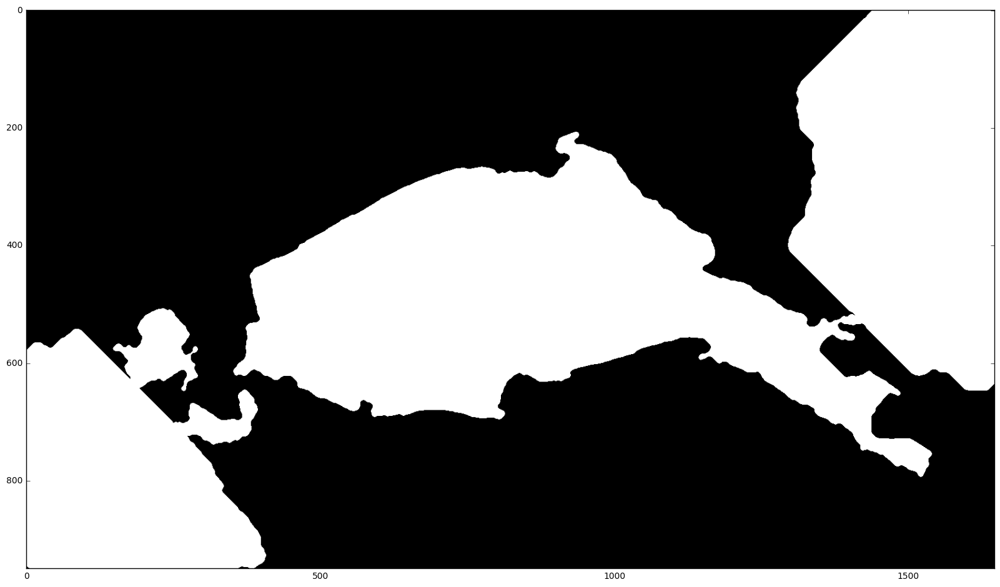

In [101]:
final_mask = np.any(final_levelsets, axis=0)
# final_mask = remove_small_objects(final_mask, min_size=3000)

plt.figure(figsize=(20,20));
plt.imshow(final_mask, cmap=plt.cm.gray);
plt.show();

In [81]:
output_dir = create_if_not_exists('/home/yuncong/CSHL_data_processed/%(stack)s/%(stack)s_mask_unsorted' % dict(stack=stack))

In [82]:
# Save binary mask as png
mask_fn = os.path.join(output_dir, '%(fn)s_mask.png' % dict(fn=fn))
if os.path.exists(mask_fn):
    sys.stderr.write('Mask exists, overwrite: %s\n' % mask_fn)
imsave(mask_fn, img_as_ubyte(final_mask))

Mask exists, overwrite: /home/yuncong/CSHL_data_processed/MD652/MD652_mask_unsorted/MD652-F51-2016.12.17-08.06.38_MD652_1_0151_mask.png
